<a href="https://colab.research.google.com/github/AbdulMuhyi02/Deep-Learning-Lanjut/blob/main/Tugas_2_Neural_Network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

TensorFlow Version: 2.19.0
GPU Available: Yes
Memuat gambar...


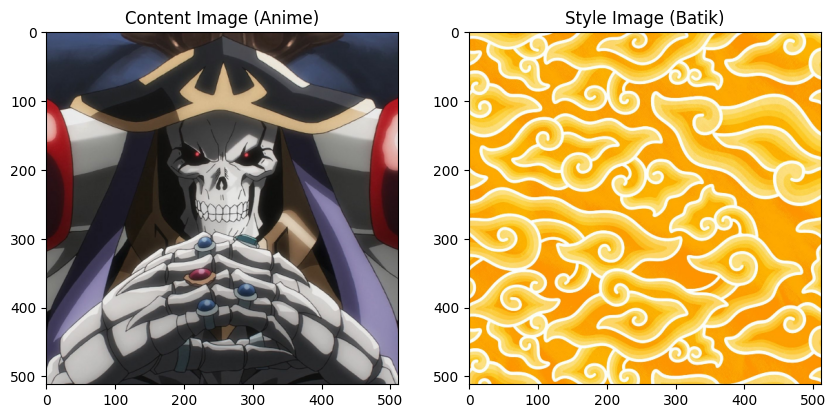

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

--- Memulai Proses Transfer Gaya Batik ke Anime ---
....................................................................................................
Epoch 1/10 selesai.


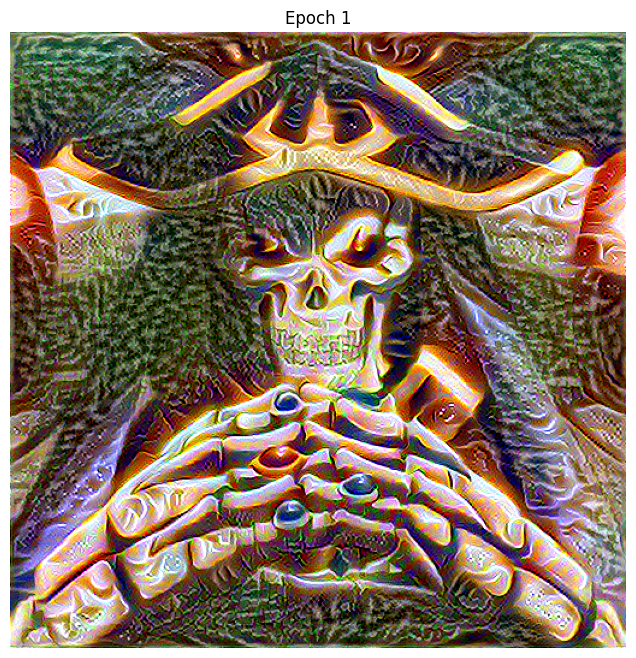

....................................................................................................
Epoch 2/10 selesai.


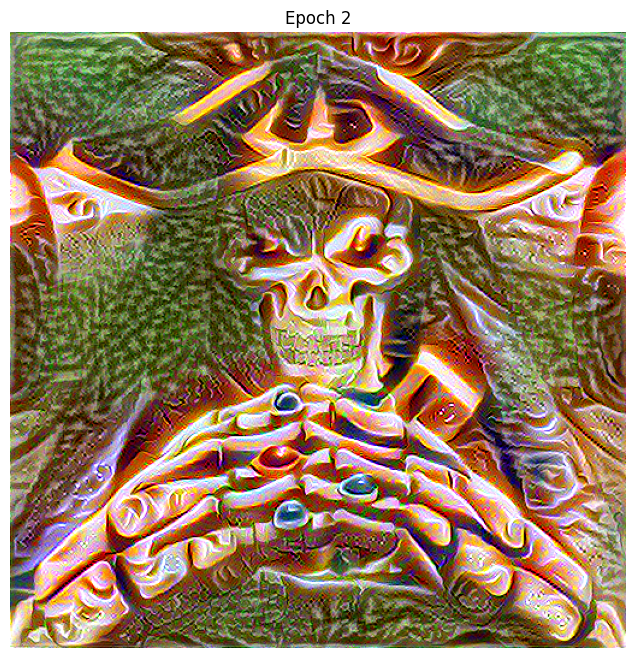

....................................................................................................
Epoch 3/10 selesai.


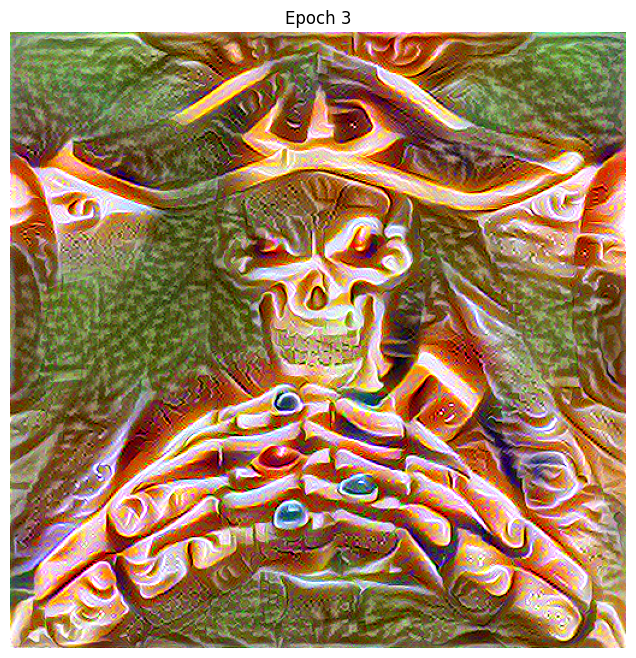

....................................................................................................
Epoch 4/10 selesai.


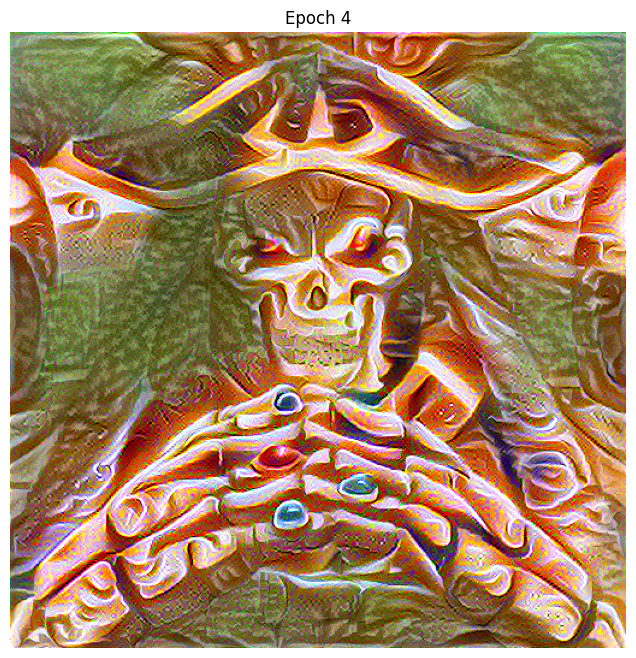

....................................................................................................
Epoch 5/10 selesai.


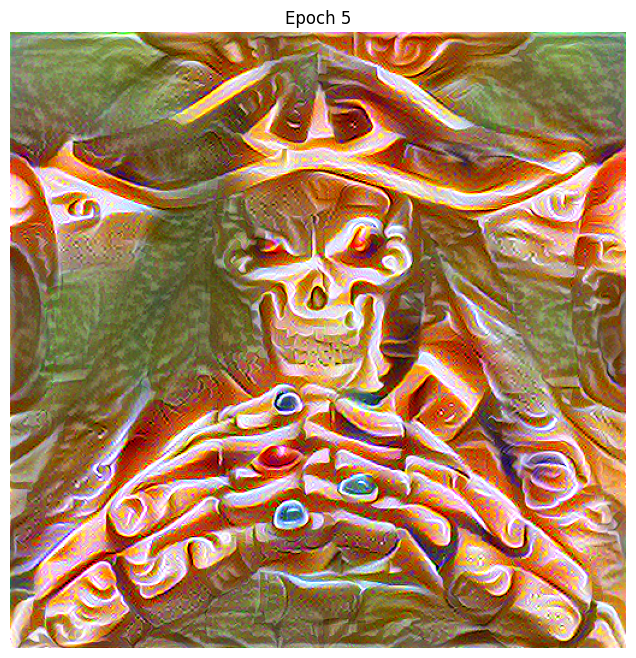

....................................................................................................
Epoch 6/10 selesai.


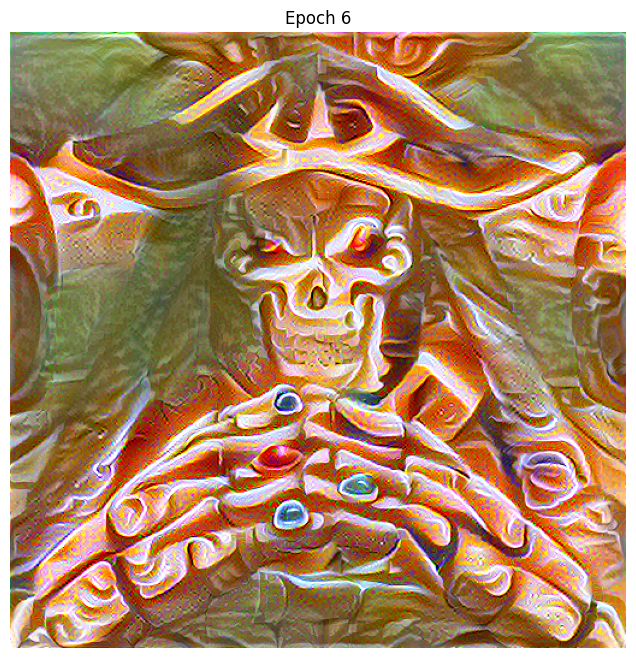

....................................................................................................
Epoch 7/10 selesai.


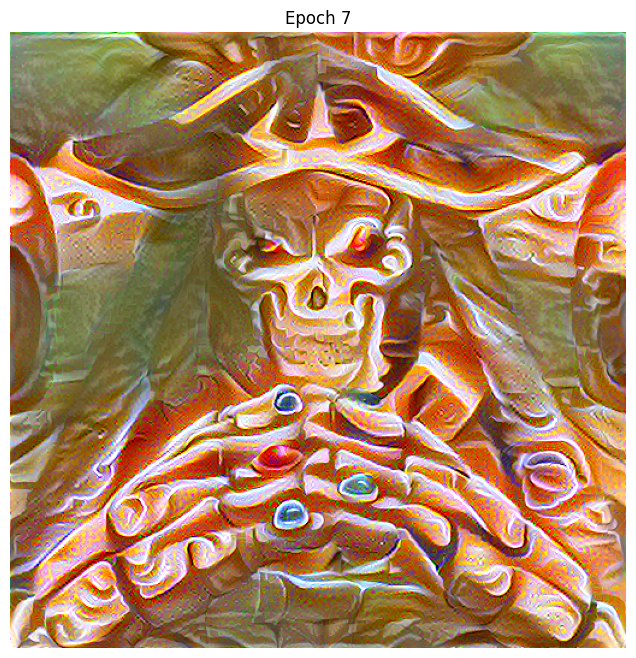

....................................................................................................
Epoch 8/10 selesai.


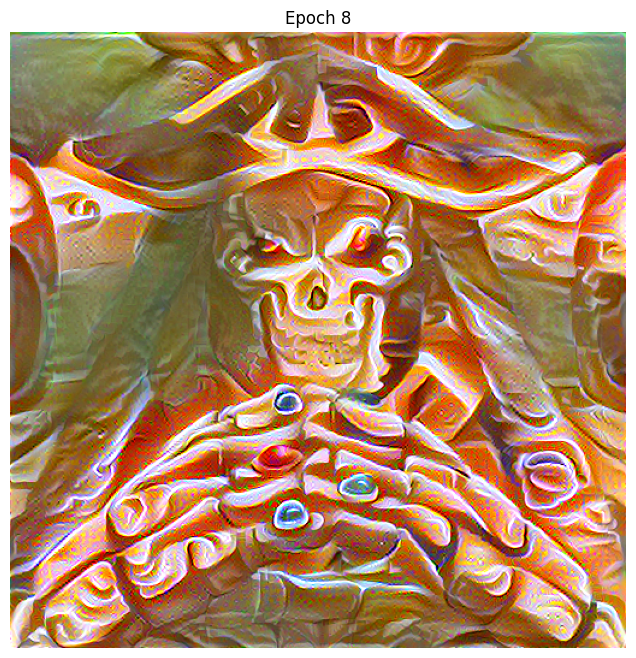

....................................................................................................
Epoch 9/10 selesai.


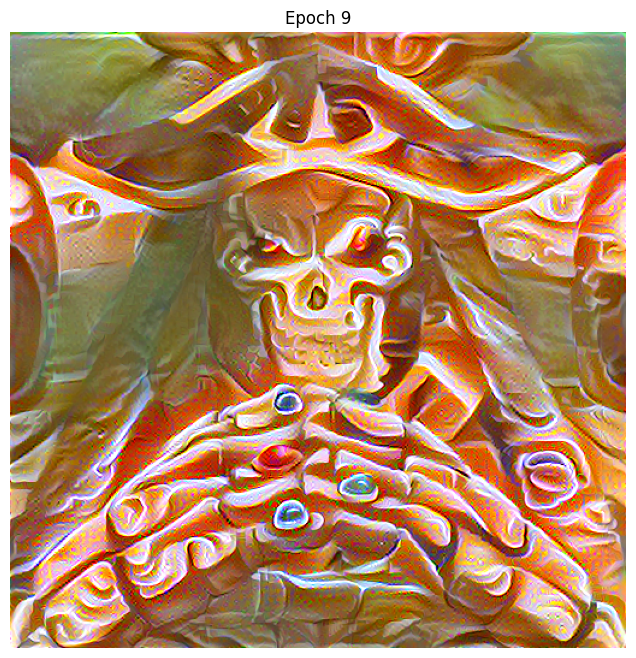

....................................................................................................
Epoch 10/10 selesai.


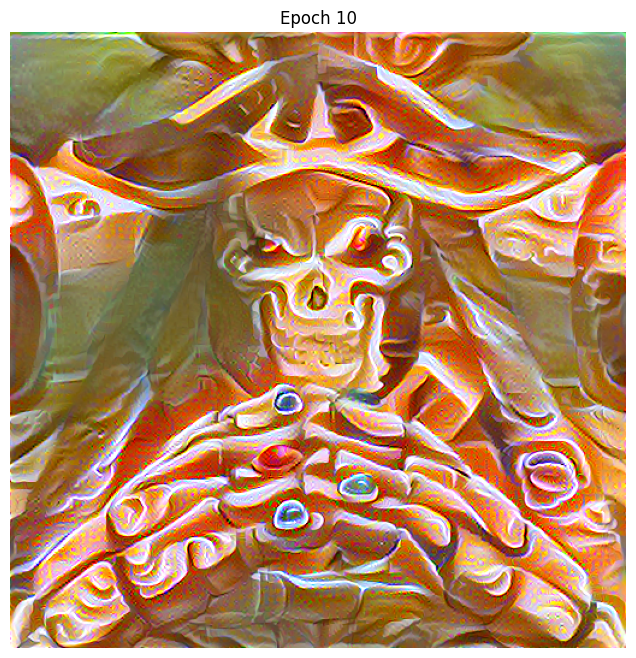


Total waktu: 99.6 detik
Gambar berhasil disimpan sebagai anime_batik_result.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1]:
import tensorflow as tf
import numpy as np
import PIL.Image
import matplotlib.pyplot as plt
import time
import functools

# --- KONFIGURASI ---
# Sesuaikan nama file jika berbeda
CONTENT_PATH = 'anime.jpg'  # Gambar struktur (Anime)
STYLE_PATH = 'batik.jpg'    # Gambar pola/tekstur (Batik)

# Parameter Hyperparameters untuk Fine-Tuning
CONTENT_WEIGHT = 1e4        # Seberapa kuat menjaga bentuk asli
STYLE_WEIGHT = 1e-2         # Seberapa kuat menerapkan motif batik
TOTAL_VARIATION_WEIGHT = 30 # Untuk menghaluskan noise (pixelated artifacts)
EPOCHS = 10                 # Jumlah epoch
STEPS_PER_EPOCH = 100       # Langkah per epoch

print("TensorFlow Version:", tf.__version__)
print("GPU Available:", "Yes" if tf.config.list_physical_devices('GPU') else "No")

# --- UTILITAS GAMBAR ---

def tensor_to_image(tensor):
    """Mengubah tensor TensorFlow kembali menjadi gambar standar untuk ditampilkan."""
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def load_img(path_to_img):
    """Memuat gambar dan membatasi dimensi maksimumnya (max 512px) untuk performa Colab."""
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)
    plt.imshow(image)
    if title:
        plt.title(title)

# --- MEMUAT GAMBAR ---
print("Memuat gambar...")
content_image = load_img(CONTENT_PATH)
style_image = load_img(STYLE_PATH)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image (Anime)')
plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image (Batik)')
plt.show()

# --- MODEL VGG19 & PREPROCESSING ---

# Kita menggunakan VGG19 layer menengah untuk style dan layer dalam untuk content
content_layers = ['block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

def vgg_layers(layer_names):
    """Membangun model VGG19 yang mengembalikan output dari layer spesifik."""
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False

    outputs = [vgg.get_layer(name).output for name in layer_names]
    model = tf.keras.Model([vgg.input], outputs)
    return model

# --- LOGIKA STYLE TRANSFER ---

def gram_matrix(input_tensor):
    """Menghitung Gram Matrix untuk representasi gaya (korelasi antar filter)."""
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result / num_locations

class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg = vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        # Input diharapkan berupa float [0,1], kita ubah ke [0,255] untuk VGG
        inputs = inputs * 255.0
        # Preprocess input sesuai standar VGG19 (RGB ke BGR, zero-centering)
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)

        style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                          outputs[self.num_style_layers:])

        style_outputs = [gram_matrix(style_output)
                         for style_output in style_outputs]

        content_dict = {content_name: value
                        for content_name, value
                        in zip(self.content_layers, content_outputs)}

        style_dict = {style_name: value
                      for style_name, value
                      in zip(self.style_layers, style_outputs)}

        return {'content': content_dict, 'style': style_dict}

# --- INISIALISASI MODEL & TARGET ---

extractor = StyleContentModel(style_layers, content_layers)

# Ekstrak target style dan content
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

# Gambar yang akan dioptimasi (dimulai dari content image agar konvergensi lebih cepat)
image = tf.Variable(content_image)

def clip_0_1(image):
    """Menjaga nilai pixel tetap di range 0.0 - 1.0"""
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

# Optimizer
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

# --- LOSS FUNCTION ---

def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']

    # Menghitung Style Loss (MSE antara Gram Matrix target dan input)
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])
    style_loss *= STYLE_WEIGHT / num_style_layers

    # Menghitung Content Loss (MSE antara Feature Map target dan input)
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= CONTENT_WEIGHT / num_content_layers

    loss = style_loss + content_loss
    return loss

# --- TRAINING LOOP ---

@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)

        # Tambahkan Total Variation Loss untuk mengurangi noise frekuensi tinggi
        loss += TOTAL_VARIATION_WEIGHT * tf.image.total_variation(image)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

print("\n--- Memulai Proses Transfer Gaya Batik ke Anime ---")
start = time.time()

for n in range(EPOCHS):
    for m in range(STEPS_PER_EPOCH):
        train_step(image)
        print(f".", end='', flush=True)

    print(f"\nEpoch {n+1}/{EPOCHS} selesai.")

    # Tampilkan hasil sementara setiap epoch
    plt.figure(figsize=(8, 8))
    imshow(image, title=f'Epoch {n+1}')
    plt.axis('off')
    plt.show()

end = time.time()
print(f"\nTotal waktu: {end-start:.1f} detik")

# --- SIMPAN HASIL ---
file_name = 'anime_batik_result.png'
tensor_to_image(image).save(file_name)

print(f"Gambar berhasil disimpan sebagai {file_name}")
try:
    from google.colab import files
    files.download(file_name)
except ImportError:
    pass